<a href="https://colab.research.google.com/github/ian-mcnair/ForageSnap/blob/master/FastAI_ResNet34_Basic_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Creating Your Own Dataset from Google Images

In [0]:
from fastai.vision import *

## Getting A List of URLS

For the below classes, the names should match the folder names in the following code blocks.

In [0]:
classes = ['peacock','pokeweed']
classes

['peacock', 'pokeweed']

These next two code blocks create a folder and file path, and then download images from the csv files into the newly created folders

In [0]:
folder = 'peacock' # Name of Classes below
file = '/content/peacock_flower_url.csv'

path = Path('/content/plants')
dest = path/folder
dest.mkdir(parents = True, exist_ok = True)

download_images(path/file, 
                dest, 
                max_pics = 1000, 
                max_workers= 0)

In [0]:
folder = 'pokeweed' # Name of classes below
file = '/content/pokeweed_fam_urls.csv'

path = Path('/content/plants')
dest = path/folder
dest.mkdir(parents = True, exist_ok = True)

download_images(path/file, 
                dest, 
                max_pics = 1000, 
                max_workers= 0)

In [0]:
path.ls() # This documents the path. You should see harmless and poisonous

[PosixPath('/content/plants/peacock'), PosixPath('/content/plants/pokeweed')]

Checks all images to see if they are "openable". It deletes any images that are not.

In [0]:
for c in classes:
  print(c)
  verify_images(path/c, 
                delete = True, 
                max_size = 500,)

Creates the data to be ingested by model. The np.random.seed shuffles the dataset...I think.

In [0]:
np.random.seed(42)
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

In [0]:
data.classes

['peacock', 'pokeweed']

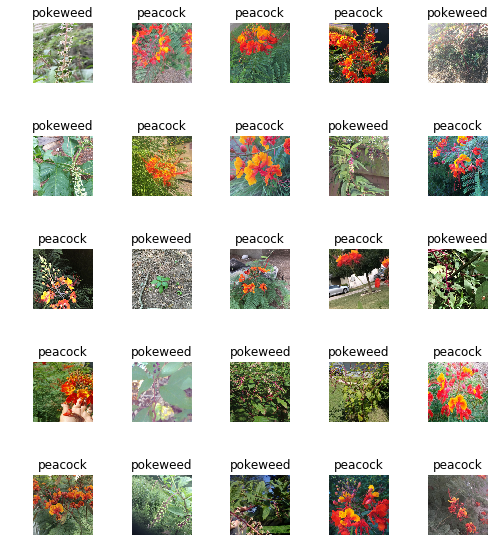

In [0]:
data.show_batch(row = 3, figsize = (7,8))
# Prints a random batch of images

In [0]:
print(data.classes)
print(f'# of Classes: {data.c}')
print(f"Length of Training Set: {len(data.train_ds)}")
print(f"Length of Validation Set: {len(data.valid_ds)}")
# Basic Info

['peacock', 'pokeweed']
# of Classes: 2
Length of Training Set: 404
Length of Validation Set: 100


In [0]:
learn = cnn_learner(data, models.resnet34, metrics=error_rate)
learn

In [0]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.665217,0.164242,0.060000,00:11
1,0.402068,0.074752,0.020000,00:08
2,0.290236,0.083558,0.030000,00:08
3,0.225573,0.095633,0.030000,00:08


In [0]:
learn.save('stage-1')

In [0]:
learn.unfreeze()

In [0]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 1.32E-06
Min loss divided by 10: 1.20E-04


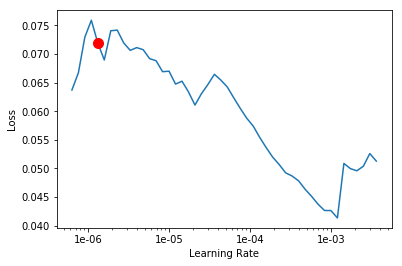

In [0]:
 learn.recorder.plot(suggestion = True)

In [0]:
learn.fit_one_cycle(10, max_lr= slice(1e-4,  1e-3))

epoch,train_loss,valid_loss,error_rate,time
0,0.038504,0.075643,0.020000,00:09
1,0.031890,0.040165,0.020000,00:09
2,0.025007,0.026762,0.010000,00:09
3,0.019284,0.060156,0.020000,00:09
4,0.020681,0.083297,0.020000,00:09
5,0.019187,0.105544,0.030000,00:09
6,0.017213,0.024905,0.010000,00:08
7,0.016225,0.012051,0.010000,00:08
8,0.016318,0.031115,0.010000,00:08
9,0.015968,0.038858,0.010000,00:08


In [0]:
learn.save('stage-2')

## Interpretation

In [0]:
learn.load('stage-2')

In [0]:
interp = ClassificationInterpretation.from_learner(learn)


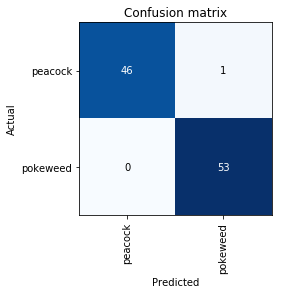

In [0]:
interp.plot_confusion_matrix()

In [0]:
learn.export()

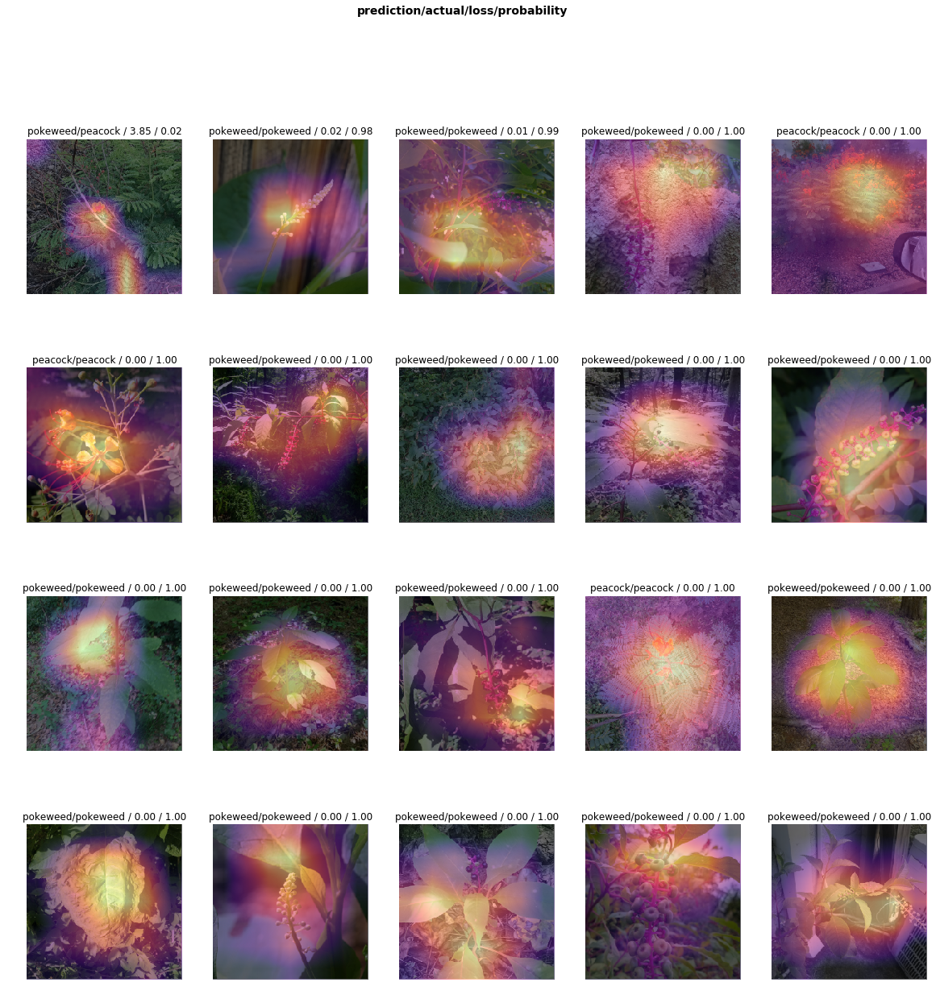

In [0]:
interp.plot_top_losses(20, largest = True, figsize= (20,20))
plt.show()

In [0]:
interp.top_losses(18)

torch.return_types.topk(values=tensor([3.8482e+00, 1.6870e-02, 5.4550e-03, 3.1588e-03, 2.5873e-03, 2.4137e-03,
        2.0425e-03, 1.5442e-03, 7.6056e-04, 5.6744e-04, 5.6362e-04, 2.5511e-04,
        2.5129e-04, 1.9431e-04, 1.8072e-04, 1.7452e-04, 6.1989e-05, 5.2929e-05]), indices=tensor([39,  9, 78, 94, 11, 70, 64, 56, 71, 73, 57,  6, 25,  0, 20, 29, 31, 86]))

In [0]:
data.valid_ds.items[39]

PosixPath('/content/plants/peacock/00000045.jpg')

## Putting Model in Production

In [0]:
learn = load_learner('/content/', 'harm_or_not_v0.0.pkl') # Path , Filename = export.pkl (default)

In [0]:
defaults.device = torch.device('cpu')

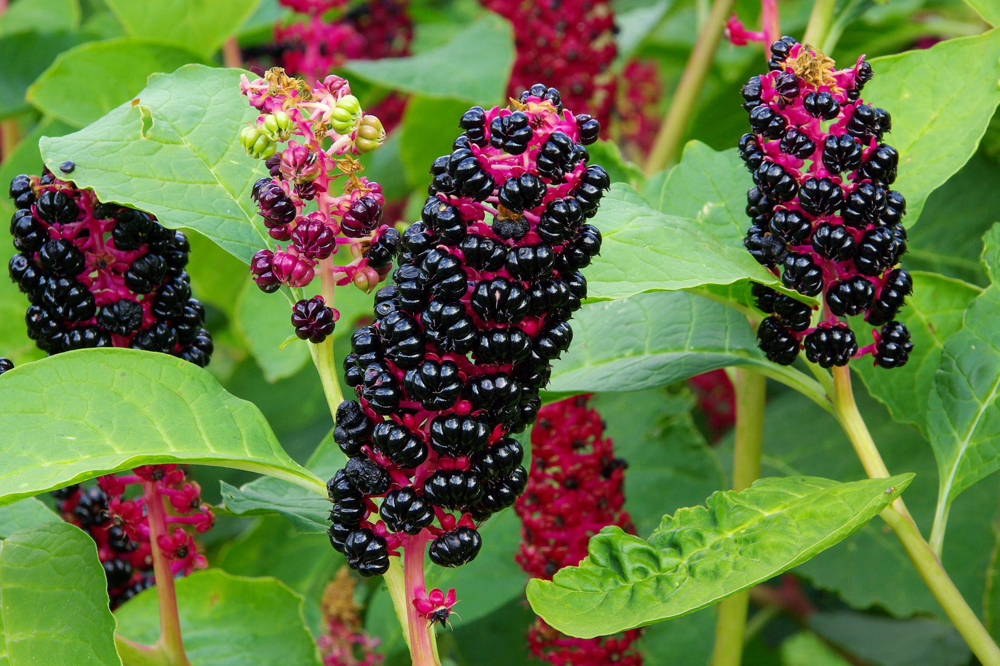

In [0]:
img = open_image('/pokeweed.jpg')
img

In [0]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class
outputs
pred_idx

tensor(1)